Song popularity Predictior

In [28]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from plotly.subplots import make_subplots
import plotly.graph_objs as go
import plotly.offline as pyo
pyo.init_notebook_mode()


In [30]:
df= pd.read_csv(r"C:\Users\Admin\Downloads\data.csv")

In [32]:
df.head()

,Unnamed: 0,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target,song_title,artist
0,0,0.0102,0.833,204600,0.434,0.021900,2,0.1650,-8.795,1,0.4310,150.062,4.0,0.286,1,Mask Off,Future
1,1,0.1990,0.743,326933,0.359,0.006110,1,0.1370,-10.401,1,0.0794,160.083,4.0,0.588,1,Redbone,Childish Gambino
2,2,0.0344,0.838,185707,0.412,0.000234,2,0.1590,-7.148,1,0.2890,75.044,4.0,0.173,1,Xanny Family,Future
3,3,0.6040,0.494,199413,0.338,0.510000,5,0.0922,-15.236,1,0.0261,86.468,4.0,0.230,1,Master Of None,Beach House
4,4,0.1800,0.678,392893,0.561,0.512000,5,0.4390,-11.648,0,0.0694,174.004,4.0,0.904,1,Parallel Lines,Junior Boys


In [34]:
df.tail()

,Unnamed: 0,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target,song_title,artist
2012,2012,0.00106,0.584,274404,0.932,0.002690,1,0.1290,-3.501,1,0.333,74.976,4.0,0.211,0,Like A Bitch - Kill The Noise Remix,Kill The Noise
2013,2013,0.08770,0.894,182182,0.892,0.001670,1,0.0528,-2.663,1,0.131,110.041,4.0,0.867,0,Candy,Dillon Francis
2014,2014,0.00857,0.637,207200,0.935,0.003990,0,0.2140,-2.467,1,0.107,150.082,4.0,0.470,0,Habit - Dack Janiels & Wenzday Remix,Rain Man
2015,2015,0.00164,0.557,185600,0.992,0.677000,1,0.0913,-2.735,1,0.133,150.011,4.0,0.623,0,First Contact,Twin Moons
2016,2016,0.00281,0.446,204520,0.915,0.000039,9,0.2180,-6.221,1,0.141,190.013,4.0,0.402,0,I Wanna Get Better,Bleachers


In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2017 entries, 0 to 2016
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        2017 non-null   int64  
 1   acousticness      2017 non-null   float64
 2   danceability      2017 non-null   float64
 3   duration_ms       2017 non-null   int64  
 4   energy            2017 non-null   float64
 5   instrumentalness  2017 non-null   float64
 6   key               2017 non-null   int64  
 7   liveness          2017 non-null   float64
 8   loudness          2017 non-null   float64
 9   mode              2017 non-null   int64  
 10  speechiness       2017 non-null   float64
 11  tempo             2017 non-null   float64
 12  time_signature    2017 non-null   float64
 13  valence           2017 non-null   float64
 14  target            2017 non-null   int64  
 15  song_title        2017 non-null   object 
 16  artist            2017 non-null   object 


In [38]:
df.columns

Index(['Unnamed: 0', 'acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode',
       'speechiness', 'tempo', 'time_signature', 'valence', 'target',
       'song_title', 'artist'],
      dtype='object')

In [40]:
df_numeric = df.select_dtypes(include='number')
correlation_matrix = df_numeric.corr()
print(correlation_matrix)


                  Unnamed: 0  acousticness  danceability  duration_ms  \
Unnamed: 0          1.000000      0.133055     -0.139615    -0.104185   
acousticness        0.133055      1.000000     -0.179894     0.071536   
danceability       -0.139615     -0.179894      1.000000     0.004695   
duration_ms        -0.104185      0.071536      0.004695     1.000000   
energy             -0.039880     -0.646319      0.038557    -0.144473   
instrumentalness   -0.104641      0.144397     -0.130561     0.305403   
key                -0.035611     -0.081037      0.022325     0.023570   
liveness           -0.039962     -0.117126     -0.132044     0.023203   
loudness            0.021935     -0.562021      0.104362    -0.273798   
mode                0.060639      0.068028     -0.047867    -0.074806   
speechiness        -0.135362     -0.099893      0.142661    -0.079562   
tempo              -0.027890     -0.127596     -0.143538    -0.076469   
time_signature     -0.053235     -0.190353      0.1

In [42]:
print(df.dtypes)

Unnamed: 0            int64
acousticness        float64
danceability        float64
duration_ms           int64
energy              float64
instrumentalness    float64
key                   int64
liveness            float64
loudness            float64
mode                  int64
speechiness         float64
tempo               float64
time_signature      float64
valence             float64
target                int64
song_title           object
artist               object
dtype: object


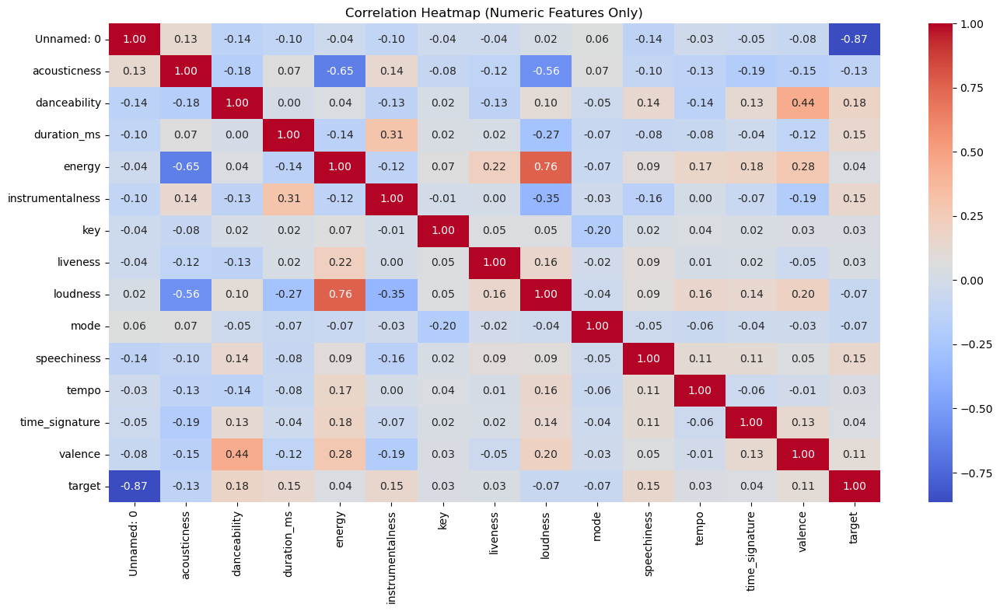

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select only numeric columns
df_numeric = df.select_dtypes(include='number')

# Plot heatmap
plt.figure(figsize=(16, 8))
sns.heatmap(df_numeric.corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title("Correlation Heatmap (Numeric Features Only)")
plt.show()


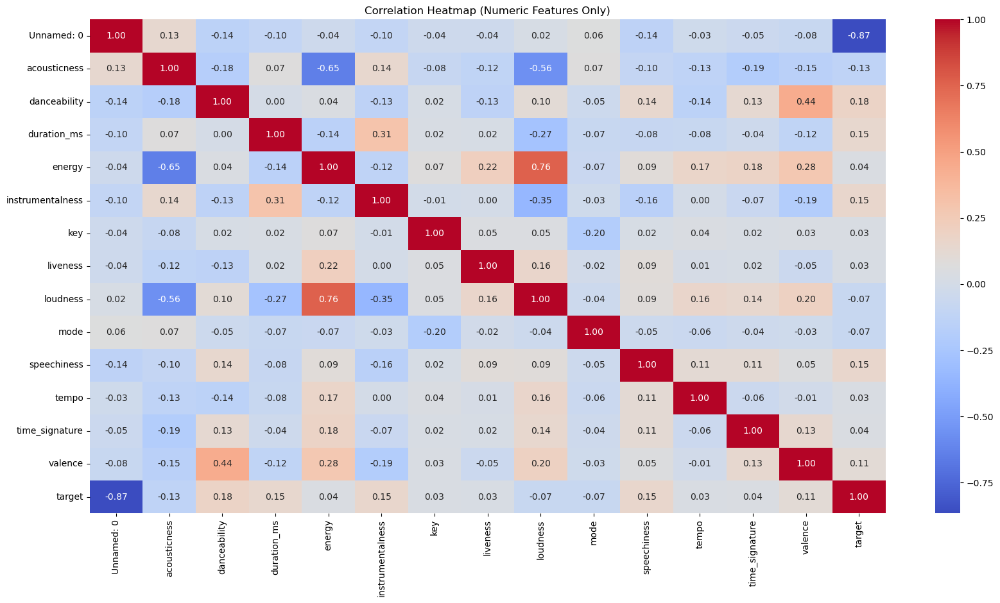

In [45]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select only numeric columns to avoid ValueError
df_numeric = df.select_dtypes(include='number')

# Plot heatmap with annotations
plt.figure(figsize=(20, 10))
sns.heatmap(df_numeric.corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title("Correlation Heatmap (Numeric Features Only)")
plt.show()


In [47]:
df

,Unnamed: 0,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target,song_title,artist
0,0,0.01020,0.833,204600,0.434,0.021900,2,0.1650,-8.795,1,0.4310,150.062,4.0,0.286,1,Mask Off,Future
1,1,0.19900,0.743,326933,0.359,0.006110,1,0.1370,-10.401,1,0.0794,160.083,4.0,0.588,1,Redbone,Childish Gambino
2,2,0.03440,0.838,185707,0.412,0.000234,2,0.1590,-7.148,1,0.2890,75.044,4.0,0.173,1,Xanny Family,Future
3,3,0.60400,0.494,199413,0.338,0.510000,5,0.0922,-15.236,1,0.0261,86.468,4.0,0.230,1,Master Of None,Beach House
4,4,0.18000,0.678,392893,0.561,0.512000,5,0.4390,-11.648,0,0.0694,174.004,4.0,0.904,1,Parallel Lines,Junior Boys
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012,2012,0.00106,0.584,274404,0.932,0.002690,1,0.1290,-3.501,1,0.3330,74.976,4.0,0.211,0,Like A Bitch - Kill The Noise Remix,Kill The Noise
2013,2013,0.08770,0.894,182182,0.892,0.001670,1,0.0528,-2.663,1,0.1310,110.041,4.0,0.867,0,Candy,Dillon Francis
2014,2014,0.00857,0.637,207200,0.935,0.003990,0,0.2140,-2.467,1,0.1070,150.082,4.0,0.470,0,Habit - Dack Janiels & Wenzday Remix,Rain Man
2015,2015,0.00164,0.557,185600,0.992,0.677000,1,0.0913,-2.735,1,0.1330,150.011,4.0,0.623,0,First Contact,Twin Moons


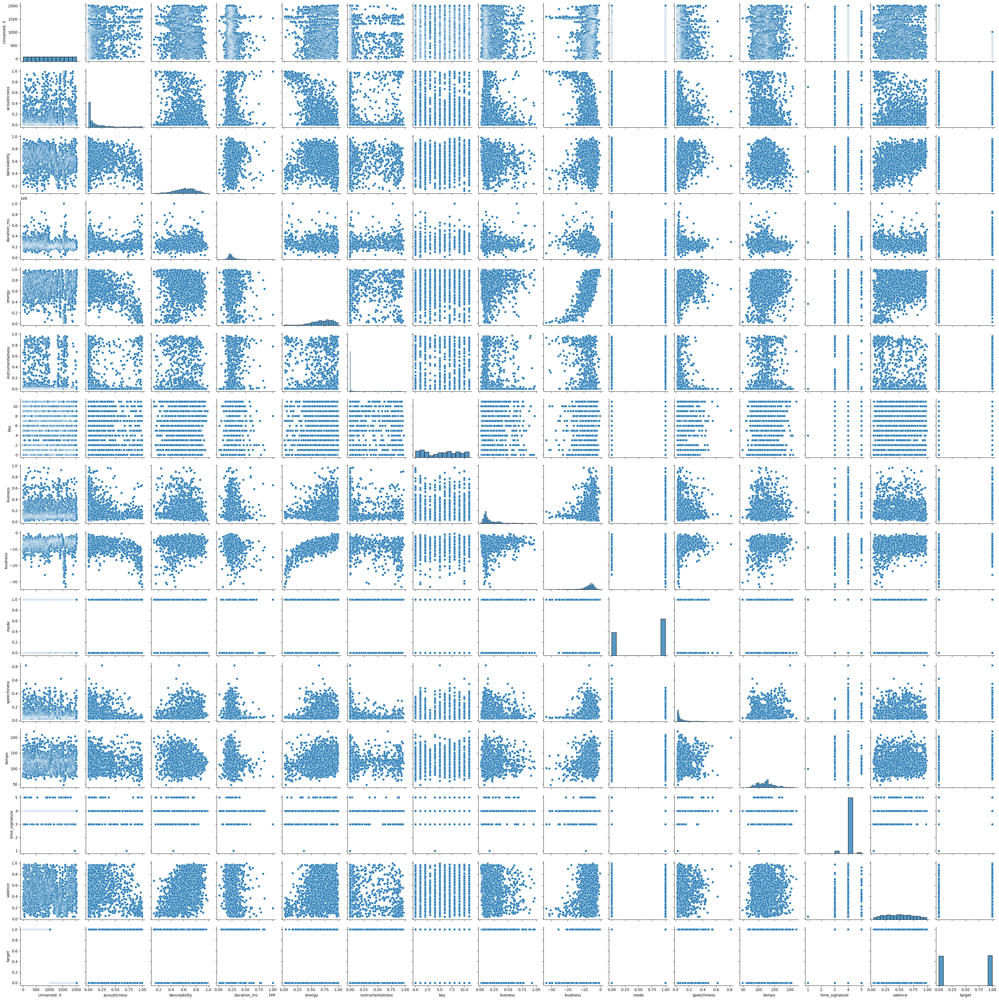

In [50]:
sns.pairplot(df)

Text(0.5, 1.0, 'Hisogram plot')

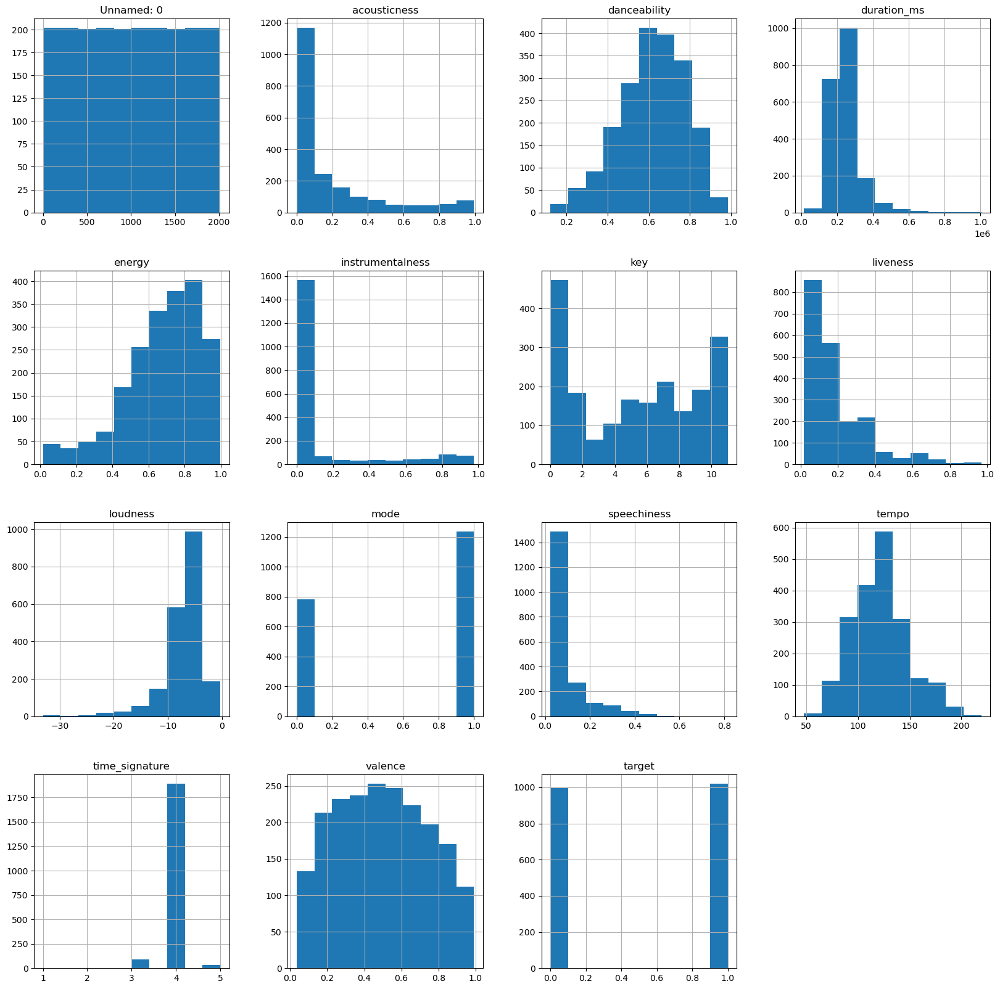

In [51]:
df.hist(figsize=(20,20))
plt.title("Hisogram plot", size=15, weight='bold')

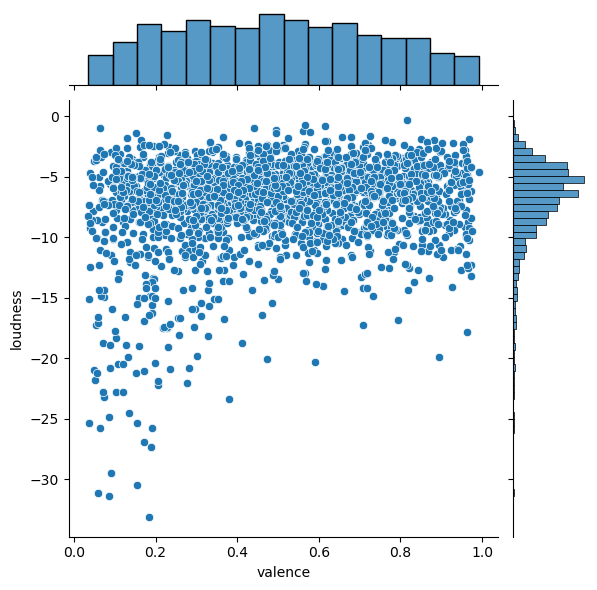

In [52]:
sns.jointplot(x='valence',y='loudness',data=df,kind='scatter')
plt.show()

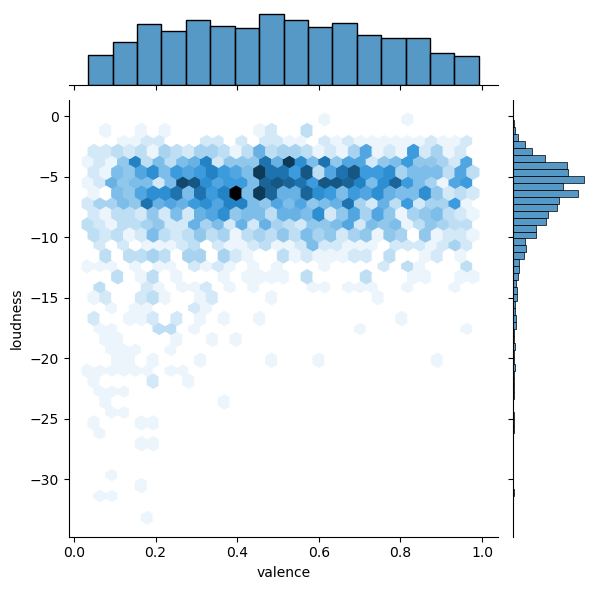

In [53]:
sns.jointplot(x='valence',y='loudness',data=df,kind='hex')
plt.show()

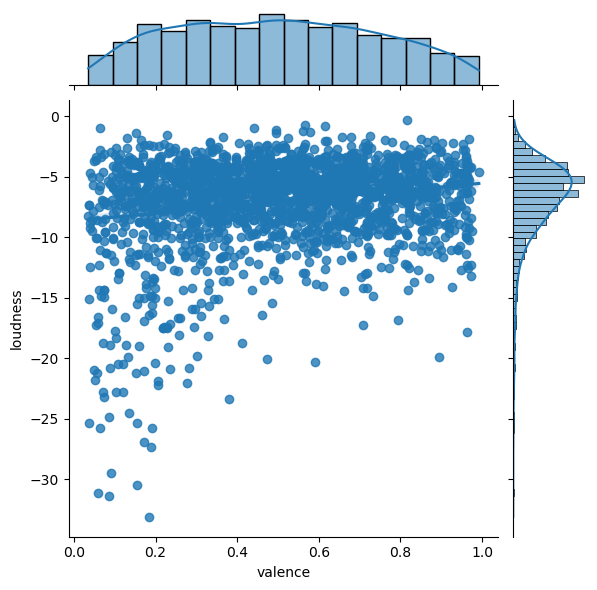

In [54]:
sns.jointplot(x='valence',y='loudness',data=df,kind='reg')
plt.show()

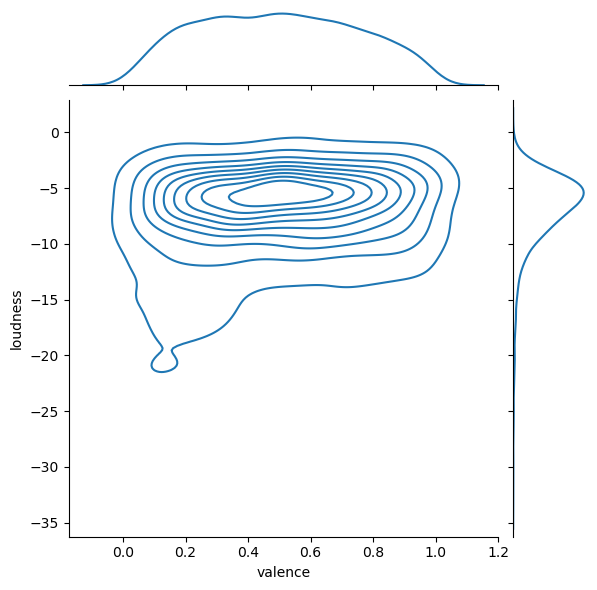

In [55]:
sns.jointplot(x='valence',y='loudness',data=df,kind='kde')
plt.show()

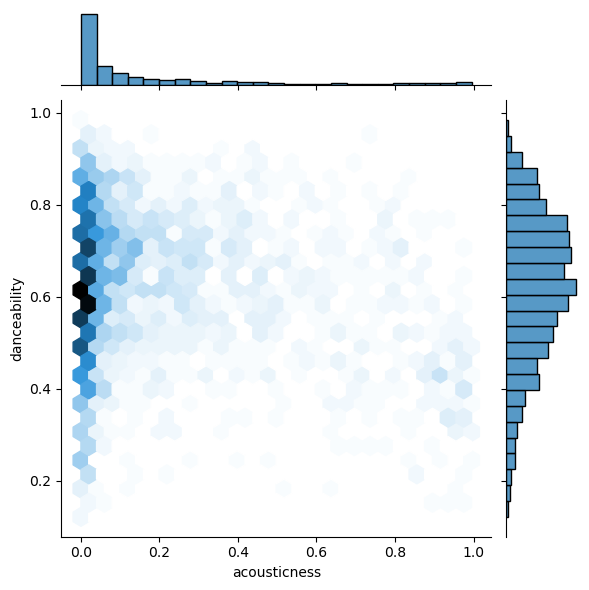

In [56]:
sns.jointplot(x='acousticness',y='danceability',data=df,kind='hex')
plt.show()

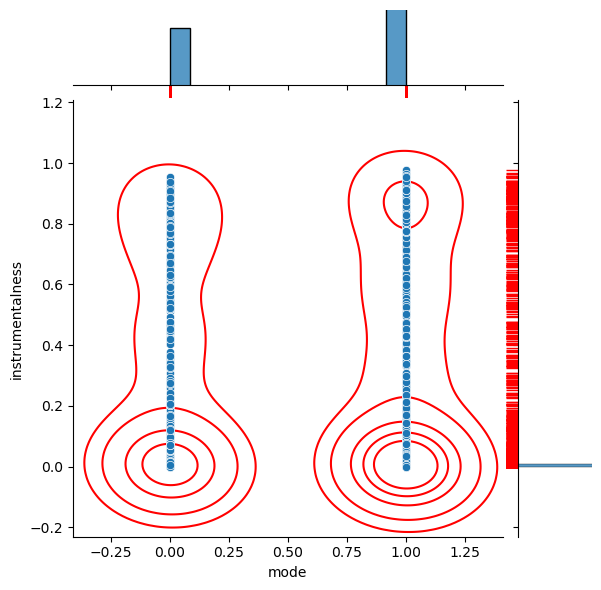

In [57]:
g = sns.jointplot(data=df, x="mode", y="instrumentalness")
g.plot_joint(sns.kdeplot, color="r", zorder=0, levels=6)
g.plot_marginals(sns.rugplot, color="r", height=-.15, clip_on=False)

In [58]:
df

,Unnamed: 0,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target,song_title,artist
0,0,0.01020,0.833,204600,0.434,0.021900,2,0.1650,-8.795,1,0.4310,150.062,4.0,0.286,1,Mask Off,Future
1,1,0.19900,0.743,326933,0.359,0.006110,1,0.1370,-10.401,1,0.0794,160.083,4.0,0.588,1,Redbone,Childish Gambino
2,2,0.03440,0.838,185707,0.412,0.000234,2,0.1590,-7.148,1,0.2890,75.044,4.0,0.173,1,Xanny Family,Future
3,3,0.60400,0.494,199413,0.338,0.510000,5,0.0922,-15.236,1,0.0261,86.468,4.0,0.230,1,Master Of None,Beach House
4,4,0.18000,0.678,392893,0.561,0.512000,5,0.4390,-11.648,0,0.0694,174.004,4.0,0.904,1,Parallel Lines,Junior Boys
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012,2012,0.00106,0.584,274404,0.932,0.002690,1,0.1290,-3.501,1,0.3330,74.976,4.0,0.211,0,Like A Bitch - Kill The Noise Remix,Kill The Noise
2013,2013,0.08770,0.894,182182,0.892,0.001670,1,0.0528,-2.663,1,0.1310,110.041,4.0,0.867,0,Candy,Dillon Francis
2014,2014,0.00857,0.637,207200,0.935,0.003990,0,0.2140,-2.467,1,0.1070,150.082,4.0,0.470,0,Habit - Dack Janiels & Wenzday Remix,Rain Man
2015,2015,0.00164,0.557,185600,0.992,0.677000,1,0.0913,-2.735,1,0.1330,150.011,4.0,0.623,0,First Contact,Twin Moons


<Axes: xlabel='energy', ylabel='loudness'>

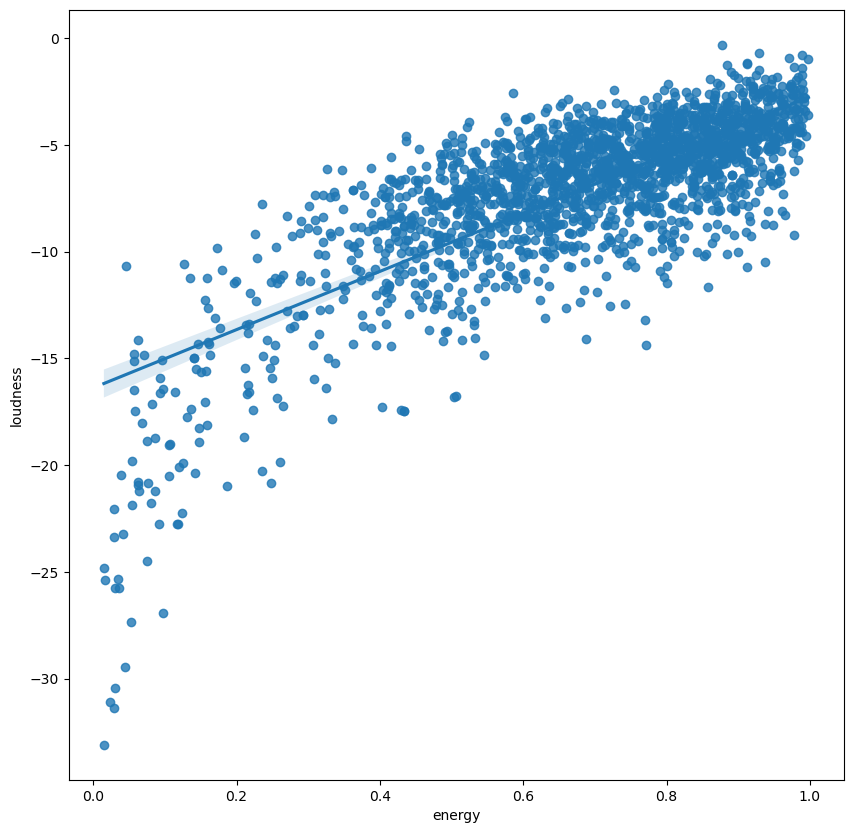

In [59]:
fig=plt.figure(figsize=(10,10))
sns.regplot(data=df,x='energy',y='loudness')

In [60]:
df['Count'] = 1
df_artist = df.groupby('artist')['Count'].sum().reset_index().sort_values(by='Count', ascending=False)
df_artist.head(10)


,artist,Count
356,Drake,16
960,Rick Ross,13
345,Disclosure,12
81,Backstreet Boys,10
1273,WALK THE MOON,10
405,FIDLAR,9
277,Crystal Castles,9
1,*NSYNC,8
409,Fall Out Boy,8
788,Michael Jackson,8


In [61]:
df_artist


,artist,Count
356,Drake,16
960,Rick Ross,13
345,Disclosure,12
81,Backstreet Boys,10
1273,WALK THE MOON,10
...,...,...
517,Hoodfellas,1
520,Hot Chocolate,1
521,Hotel Eden,1
522,How Sad,1


In [63]:
import plotly.express as px

fig = px.bar(df_artist.head(10), x='artist', y='Count', text_auto=True)
fig.update_layout(
    legend_orientation="h",
    legend=dict(x=0, y=1, traceorder='normal'),
    title="Top 10 Artists",
    margin=dict(l=0, r=0, t=30, b=0)
)
fig.show()


In [64]:
import plotly.express as px

fig = px.pie(
    df_artist.head(10),
    values='Count',
    names='artist',
    hole=0.4
)

fig.update_layout(
    title='Top 10 Artists of 2021',
    font_size=15,
    title_x=0.45,
    annotations=[dict(text='Artist', font_size=25, showarrow=False)]
)

fig.update_traces(
    textfont_size=15,
    textinfo='percent'
)

fig.show()


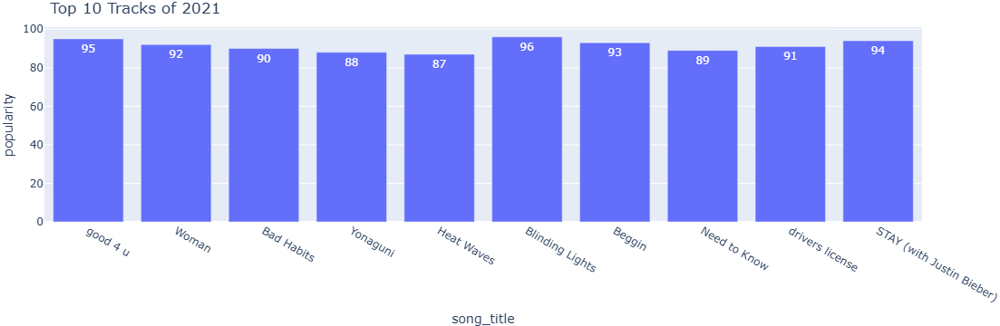

In [74]:
import pandas as pd
import plotly.express as px

# Sample data - replace with your actual popularity values
data = {'song_title': ['good 4 u', 'Woman', 'Bad Habits', 'Yonaguni', 'Heat Waves', 'Blinding Lights',
                       'Beggin', 'Need to Know', 'drivers license', 'STAY (with Justin Bieber)'],
        'popularity': [95, 92, 90, 88, 87, 96, 93, 89, 91, 94]}

df_top_tracks = pd.DataFrame(data)

fig = px.bar(df_top_tracks, x='song_title', y='popularity', text_auto=True,
             title='Top 10 Tracks of 2021')

fig.update_layout(legend_orientation='h',
                  legend=dict(x=0, y=1, traceorder='normal'),
                  margin=dict(l=0, r=0, t=30, b=0))

fig.show()

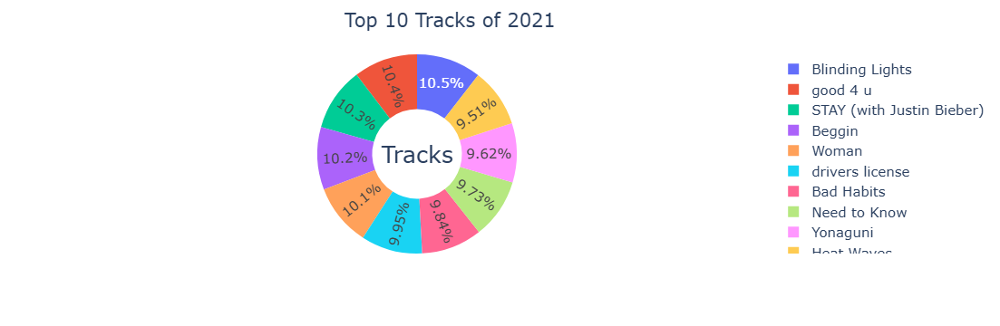

In [76]:
fig=px.pie(df_top_tracks,values='popularity',names=['good 4 u','Woman','Bad Habits','Yonaguni','Heat Waves','Blinding Lights',
                               'Beggin','Need to Know','drivers license','STAY (with Justin Bieber)'],hole=0.45)
fig.update_layout(title='Top 10 Tracks of 2021',font_size=15,title_x=0.45,annotations=[dict(text='Tracks',font_size=25, showarrow=False,height=800,width=700)])
fig.update_traces(textfont_size=15,textinfo='percent')
fig.show()

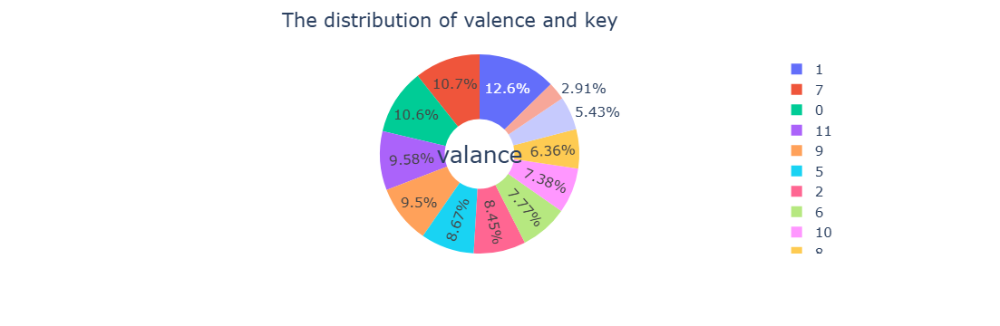

In [78]:
fig=px.pie(df,values='valence',names='key',hole=0.35)
fig.update_layout(title='The distribution of valence and key ',font_size=15,title_x=0.45,annotations=[dict(text='valance',font_size=25, showarrow=False,height=800,width=700)])
fig.update_traces(textfont_size=15,textinfo='percent')
fig.show()

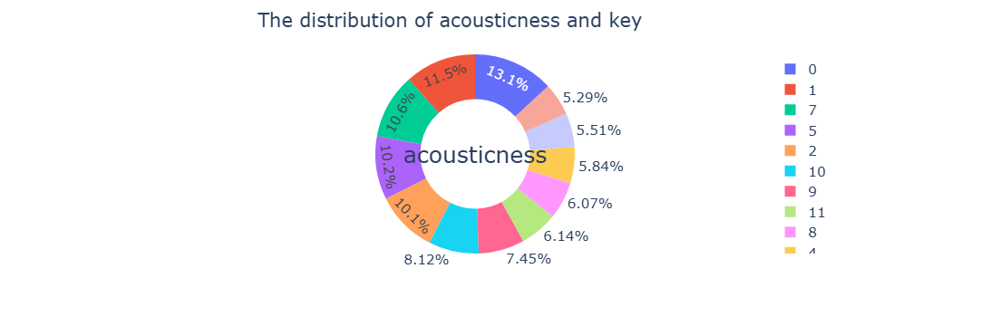

In [80]:
fig=px.pie(df,values='acousticness',names='key',hole=0.55)
fig.update_layout(title='The distribution of acousticness and key ',font_size=15,title_x=0.45,annotations=[dict(text='acousticness',font_size=25, showarrow=False,height=800,width=700)])
fig.update_traces(textfont_size=15,textinfo='percent')
fig.show()

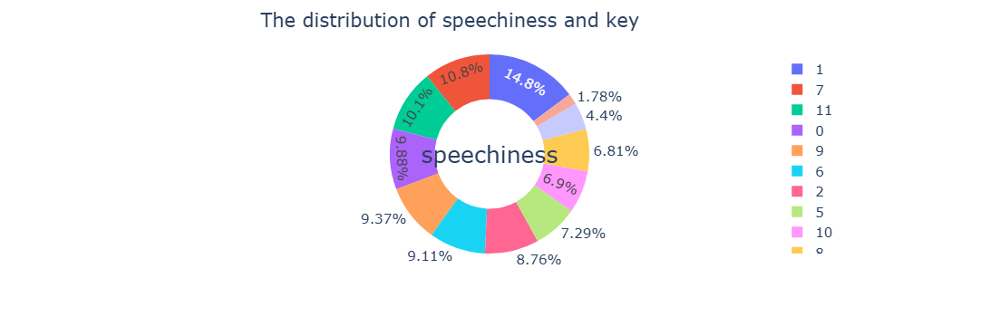

In [82]:
fig=px.pie(df,values='speechiness',names='key',hole=0.55)
fig.update_layout(title='The distribution of speechiness and key ',font_size=15,title_x=0.45,annotations=[dict(text='speechiness',font_size=25, showarrow=False,height=800,width=700)])
fig.update_traces(textfont_size=15,textinfo='percent')
fig.show()

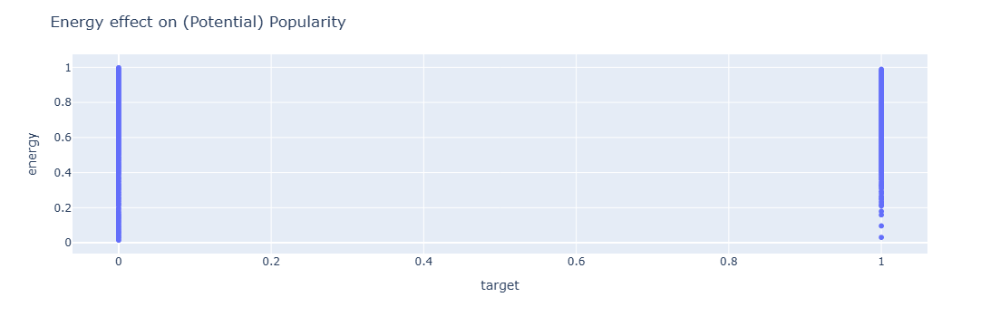

In [84]:
import plotly.express as px

fig = px.scatter(df, x="target", y="energy")
fig.update_layout(legend_orientation='h',
                  legend=dict(x=0, y=1, traceorder='normal'),
                  title='Energy effect on (Potential) Popularity')
fig.show()

In [86]:
print(df.columns)

Index(['Unnamed: 0', 'acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode',
       'speechiness', 'tempo', 'time_signature', 'valence', 'target',
       'song_title', 'artist', 'Count'],
      dtype='object')


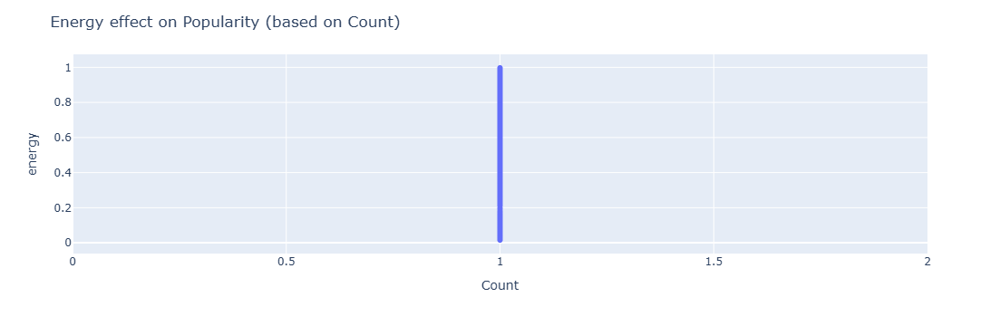

In [88]:
import plotly.express as px

fig = px.scatter(df, x="Count", y="energy")
fig.update_layout(legend_orientation='h',
                  legend=dict(x=0, y=1, traceorder='normal'),
                  title='Energy effect on Popularity (based on Count)')
fig.show()

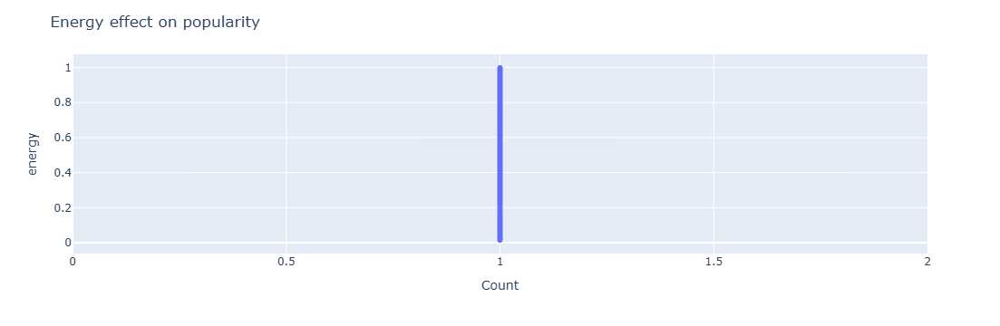

In [90]:

fig.update_layout(legend_orientation='h',
                  legend=dict(x=0, y=1, traceorder='normal'),
                  title='Energy effect on popularity')
fig.show()

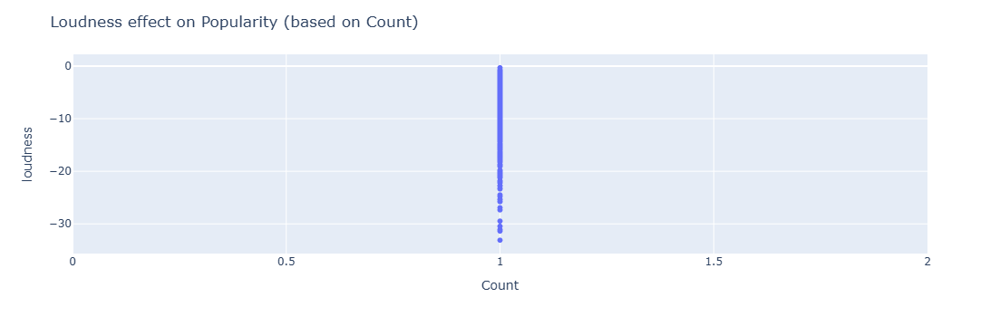

In [92]:
import plotly.express as px

fig = px.scatter(df, x="Count", y="loudness")
fig.update_layout(legend_orientation='h',
                  legend=dict(x=0, y=1, traceorder='normal'),
                  title='Loudness effect on Popularity (based on Count)')
fig.show()

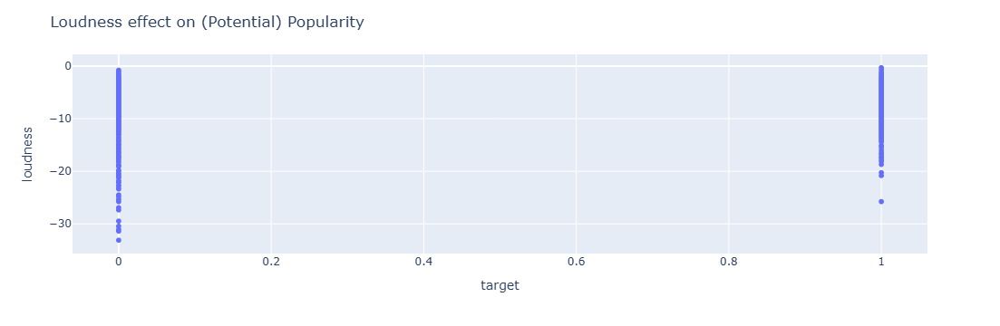

In [94]:
import plotly.express as px

fig = px.scatter(df, x="target", y="loudness")
fig.update_layout(legend_orientation='h',
                  legend=dict(x=0, y=1, traceorder='normal'),
                  title='Loudness effect on (Potential) Popularity')
fig.show()

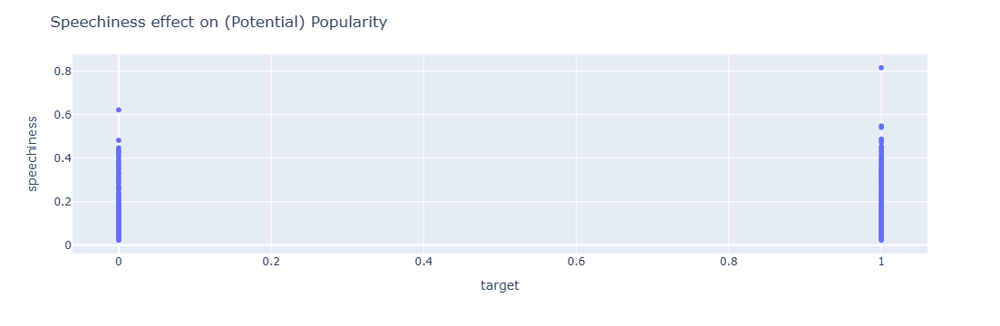

In [96]:
import plotly.express as px

fig = px.scatter(df, x="target", y="speechiness")
fig.update_layout(legend_orientation='h',
                  legend=dict(x=0, y=1, traceorder='normal'),
                  title='Speechiness effect on (Potential) Popularity')
fig.show()

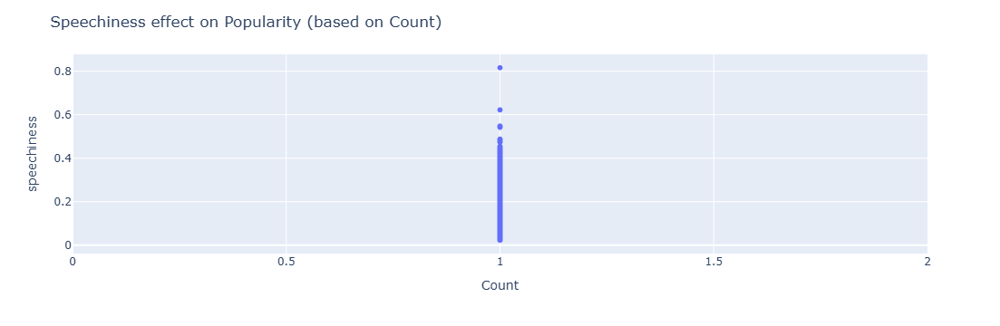

In [98]:
import plotly.express as px

fig = px.scatter(df, x="Count", y="speechiness")
fig.update_layout(legend_orientation='h',
                  legend=dict(x=0, y=1, traceorder='normal'),
                  title='Speechiness effect on Popularity (based on Count)')
fig.show()

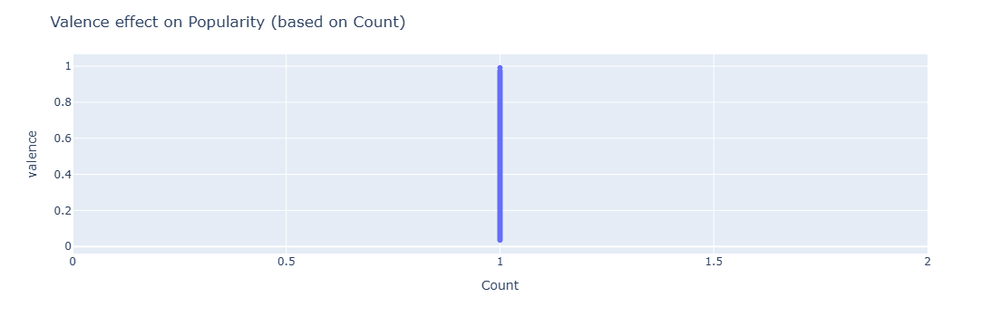

In [100]:
import plotly.express as px

fig = px.scatter(df, x="Count", y="valence")
fig.update_layout(legend_orientation='h',
                  legend=dict(x=0, y=1, traceorder='normal'),
                  title='Valence effect on Popularity (based on Count)')
fig.show()

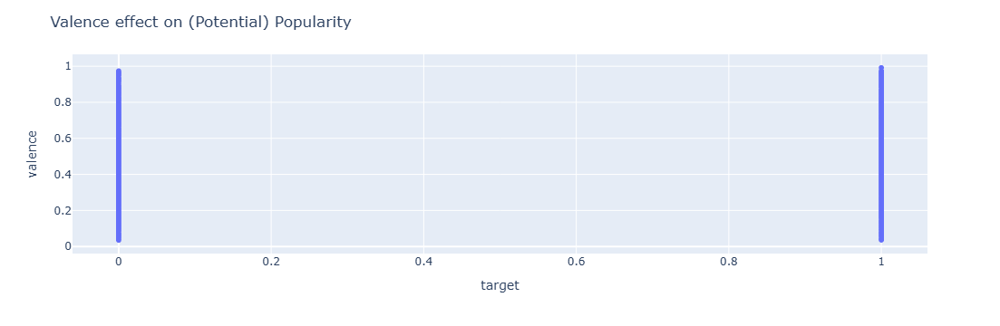

In [102]:
import plotly.express as px

fig = px.scatter(df, x="target", y="valence")
fig.update_layout(legend_orientation='h',
                  legend=dict(x=0, y=1, traceorder='normal'),
                  title='Valence effect on (Potential) Popularity')
fig.show()

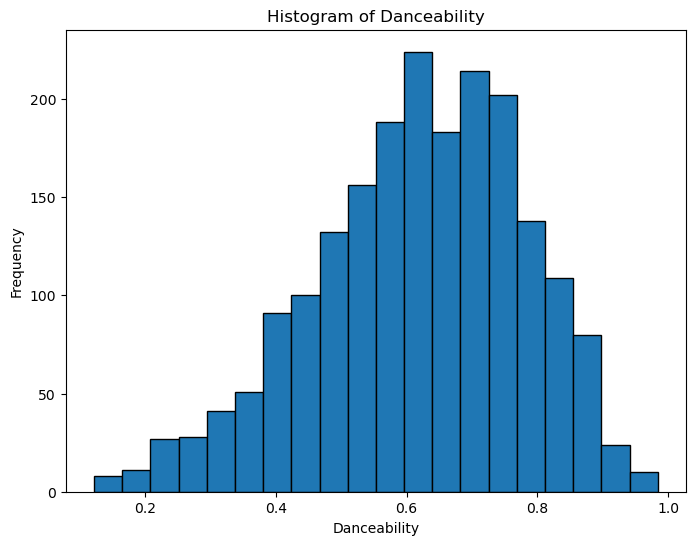

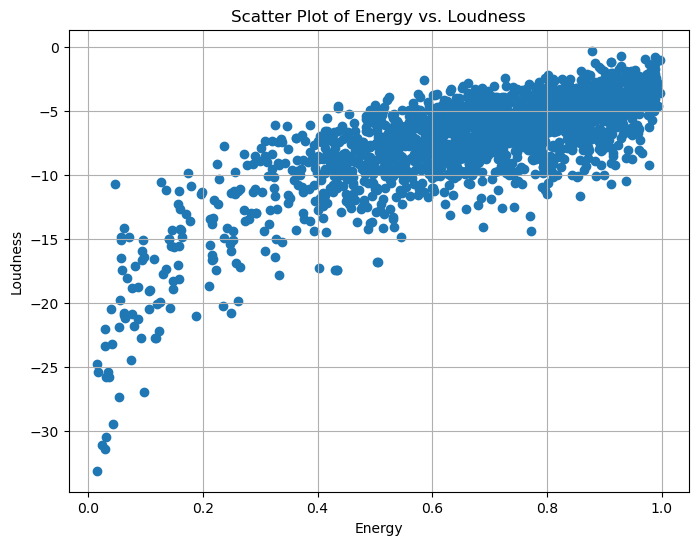

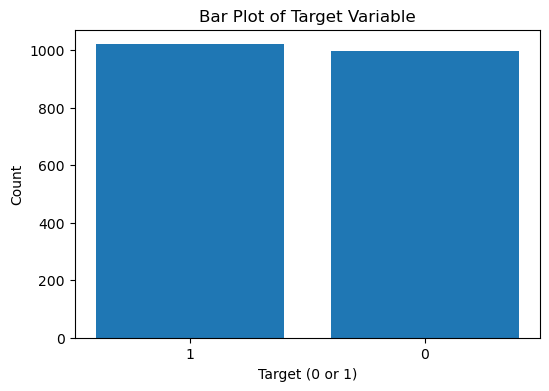

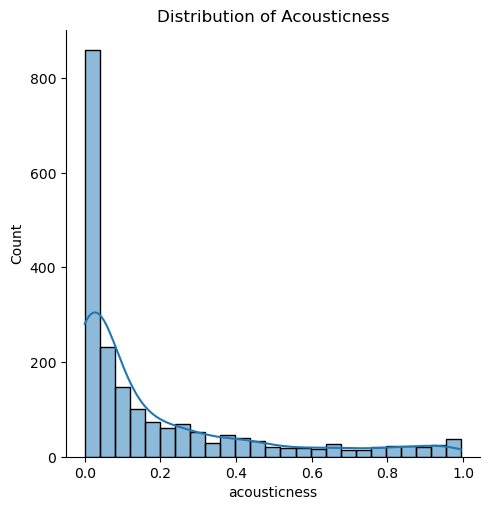

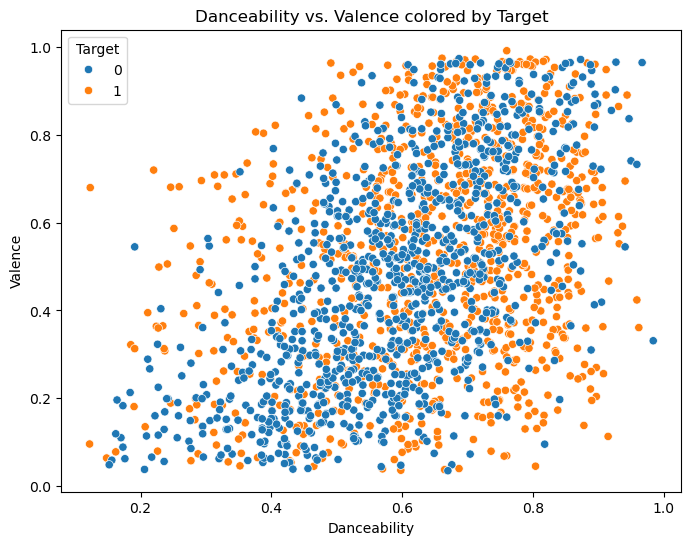

C:\Users\Admin\AppData\Local\Temp\ipykernel_1476\4241827392.py:55: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




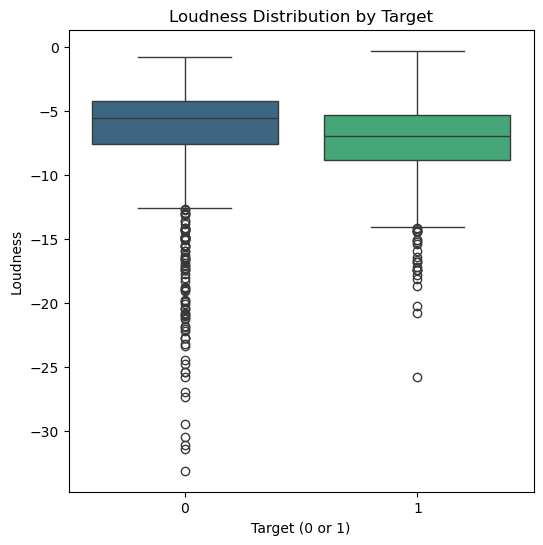

C:\Users\Admin\AppData\Local\Temp\ipykernel_1476\4241827392.py:63: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




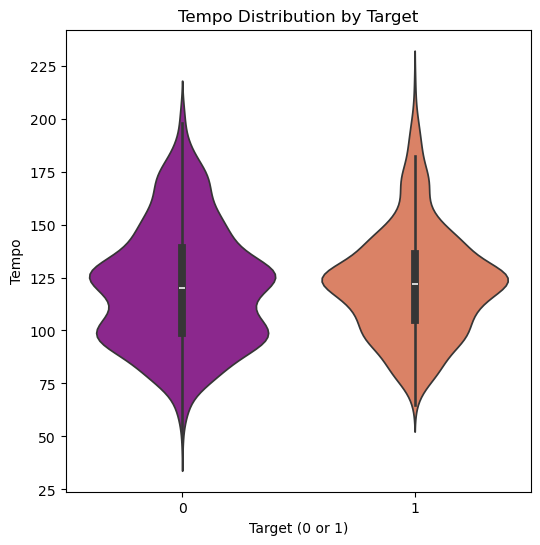

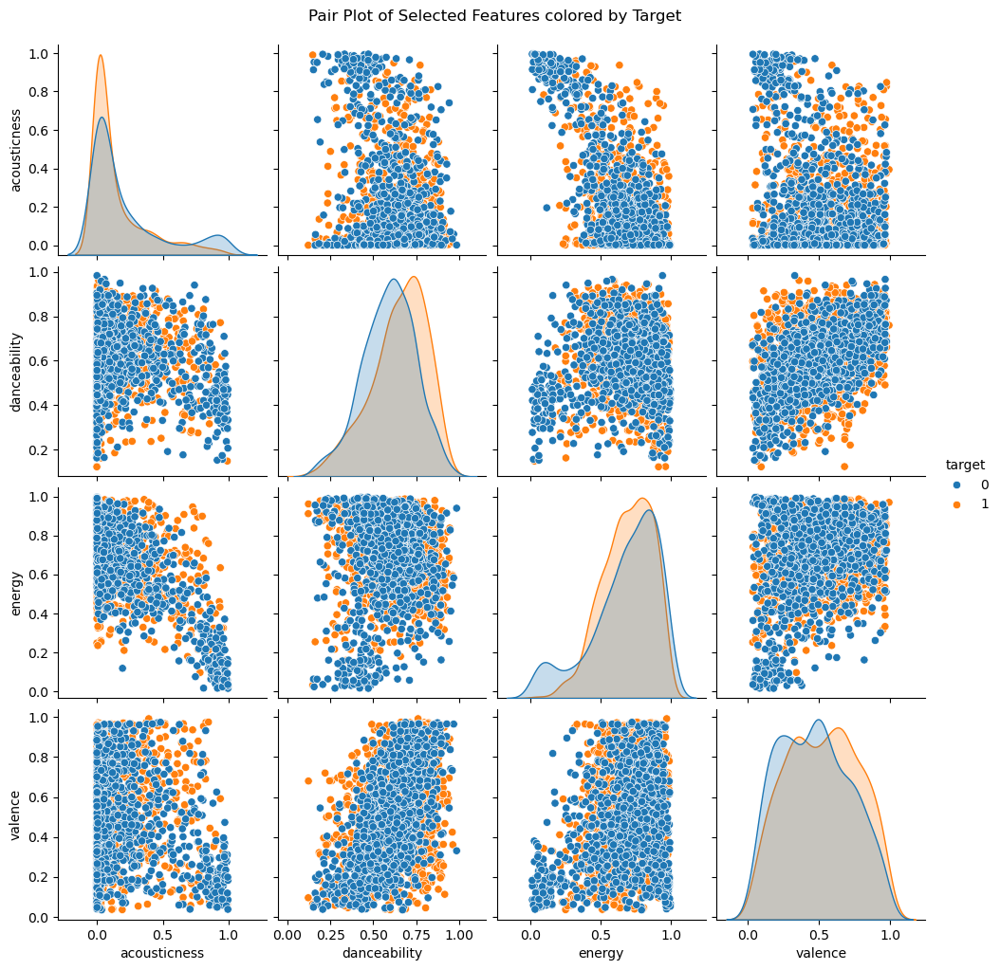

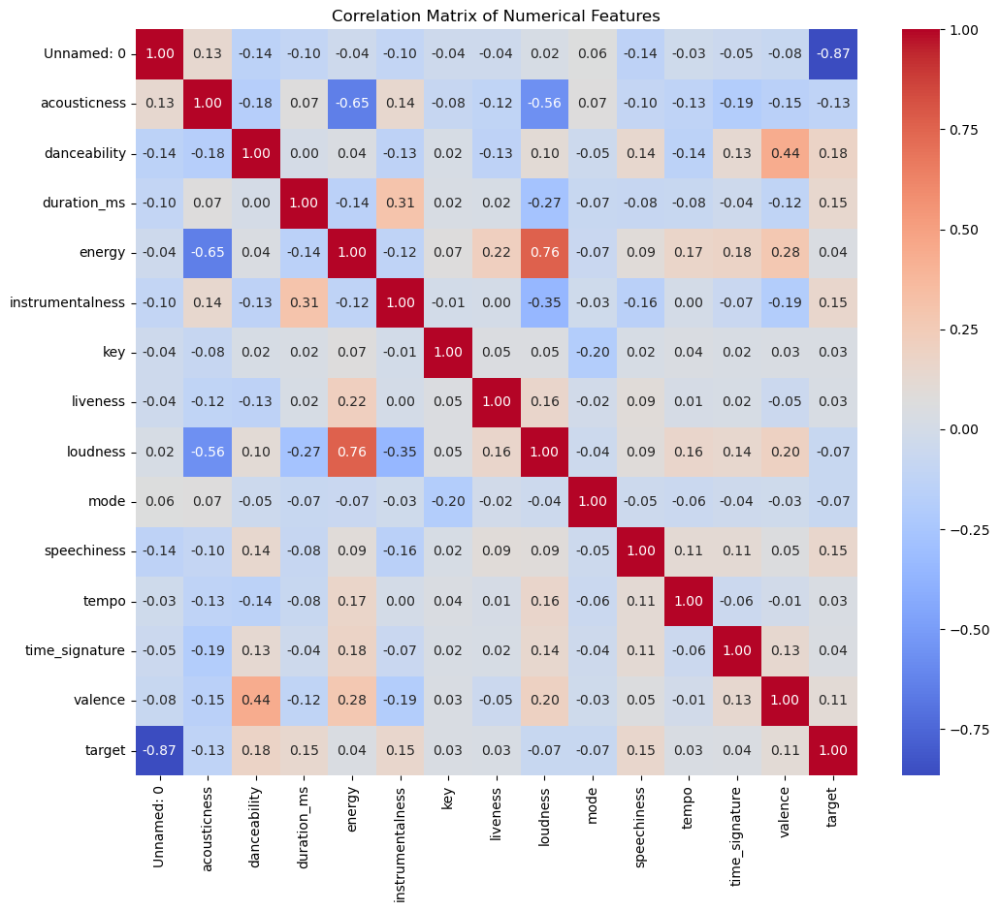

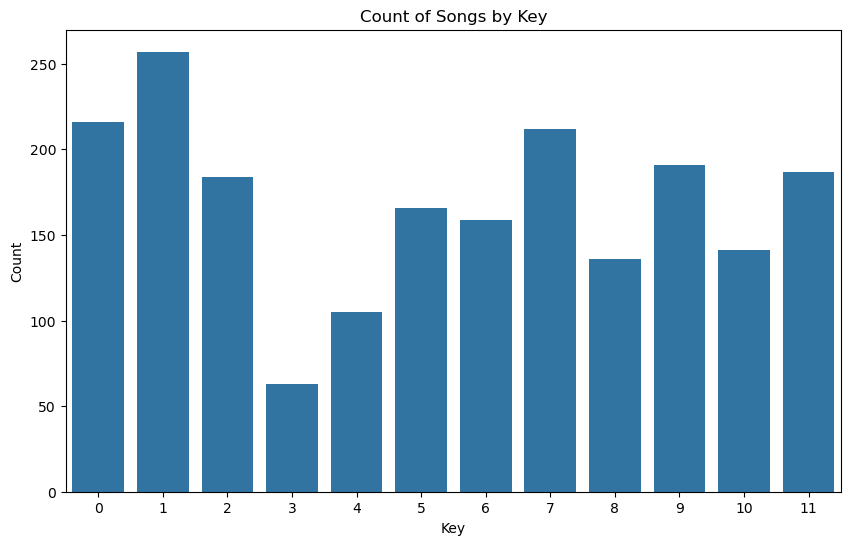

In [104]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Load your data (you've already done this)
df = pd.read_csv(r"C:\Users\Admin\Downloads\data.csv")

# --- Basic Matplotlib Plots ---

# 1. Histogram of a numerical feature (e.g., danceability)
plt.figure(figsize=(8, 6))
plt.hist(df['danceability'], bins=20, edgecolor='black')
plt.xlabel('Danceability')
plt.ylabel('Frequency')
plt.title('Histogram of Danceability')
plt.show()

# 2. Scatter plot of two numerical features (e.g., energy vs. loudness)
plt.figure(figsize=(8, 6))
plt.scatter(df['energy'], df['loudness'])
plt.xlabel('Energy')
plt.ylabel('Loudness')
plt.title('Scatter Plot of Energy vs. Loudness')
plt.grid(True)
plt.show()

# 3. Bar plot of a categorical feature (e.g., target - assuming it's treated as categorical here)
target_counts = df['target'].value_counts()
plt.figure(figsize=(6, 4))
plt.bar(target_counts.index.astype(str), target_counts.values)
plt.xlabel('Target (0 or 1)')
plt.ylabel('Count')
plt.title('Bar Plot of Target Variable')
plt.show()

# --- Seaborn Plots ---

# 4. Seaborn histogram/distribution plot (e.g., acousticness)
sns.displot(df, x='acousticness', kde=True)
plt.title('Distribution of Acousticness')
plt.show()

# 5. Seaborn scatter plot with color by a categorical feature (e.g., target)
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='danceability', y='valence', hue='target')
plt.xlabel('Danceability')
plt.ylabel('Valence')
plt.title('Danceability vs. Valence colored by Target')
plt.legend(title='Target')
plt.show()

# 6. Seaborn box plot to compare a numerical feature across categories (e.g., loudness by target)
plt.figure(figsize=(6, 6))
sns.boxplot(data=df, x='target', y='loudness', palette='viridis')
plt.xlabel('Target (0 or 1)')
plt.ylabel('Loudness')
plt.title('Loudness Distribution by Target')
plt.show()

# 7. Seaborn violin plot (similar to box plot, showing distribution shape)
plt.figure(figsize=(6, 6))
sns.violinplot(data=df, x='target', y='tempo', palette='plasma')
plt.xlabel('Target (0 or 1)')
plt.ylabel('Tempo')
plt.title('Tempo Distribution by Target')
plt.show()

# 8. Seaborn pair plot for numerical features (select a few to avoid clutter)
sns.pairplot(df[['acousticness', 'danceability', 'energy', 'valence', 'target']], hue='target')
plt.suptitle('Pair Plot of Selected Features colored by Target', y=1.02)
plt.show()

# 9. Seaborn heatmap of the correlation matrix (as you already calculated)
df_numeric = df.select_dtypes(include='number')
correlation_matrix = df_numeric.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Numerical Features')
plt.show()

# 10. Seaborn count plot for a categorical feature (e.g., key - though it's integer, it's likely categorical)
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='key')
plt.xlabel('Key')
plt.ylabel('Count')
plt.title('Count of Songs by Key')
plt.show()



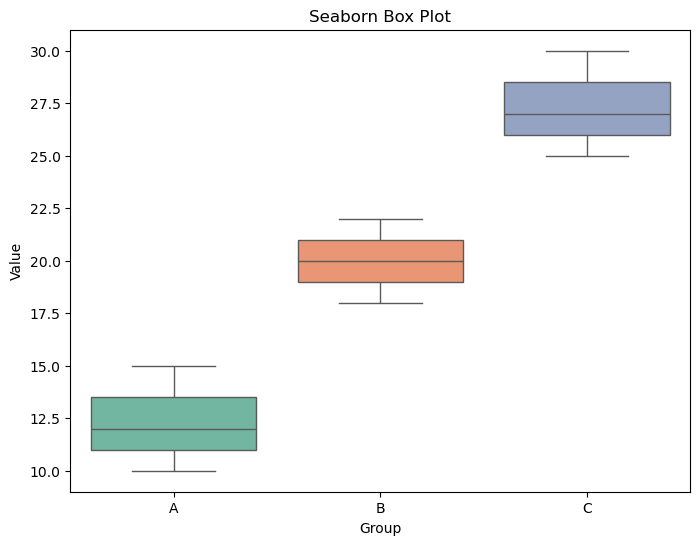

In [124]:
# 4. Seaborn Box Plot
plt.figure(figsize=(8, 6))
sns.boxplot(data=boxplot_data, x='Group', y='Value', hue='Group', palette='Set2', legend=False)
plt.xlabel('Group')
plt.ylabel('Value')
plt.title('Seaborn Box Plot')
plt.show()

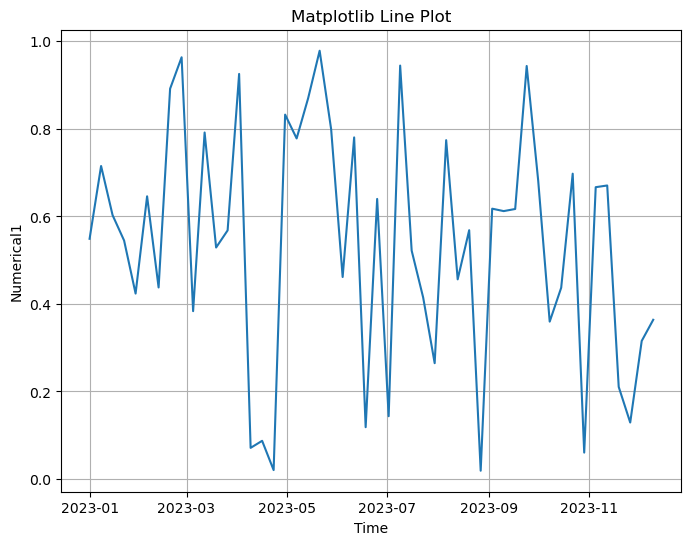

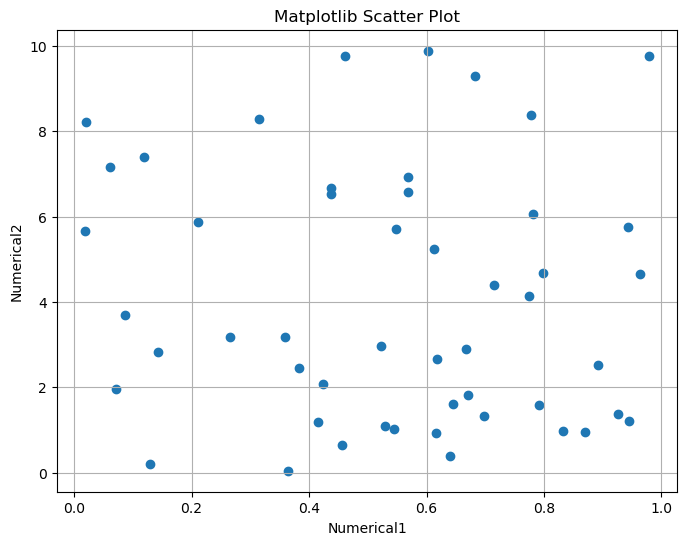

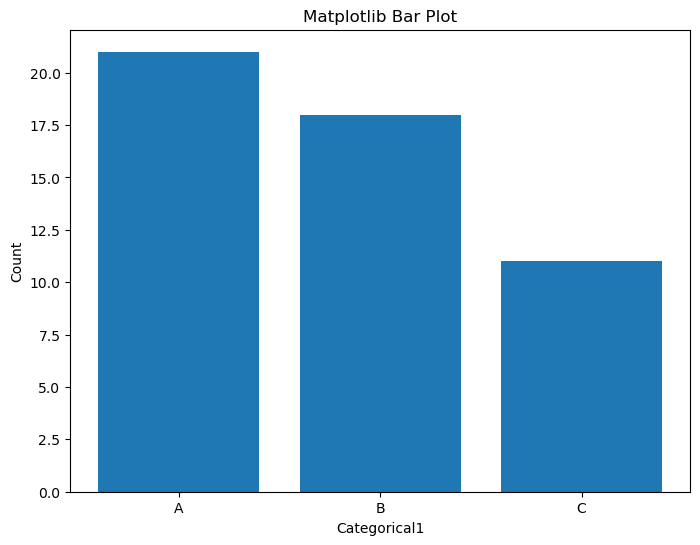

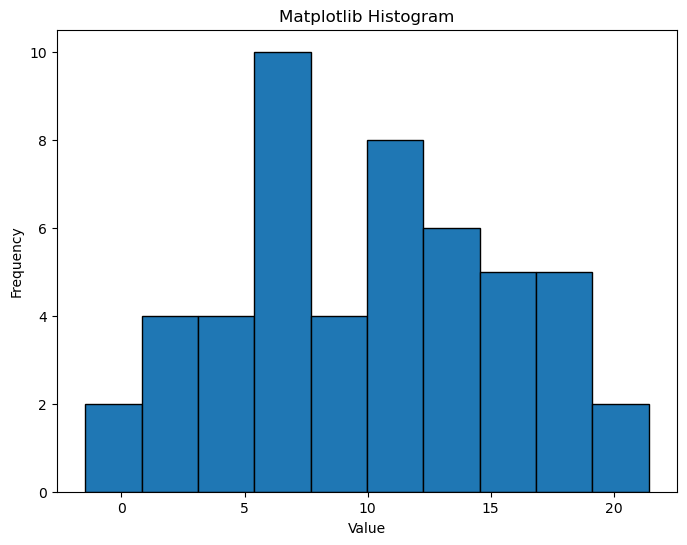

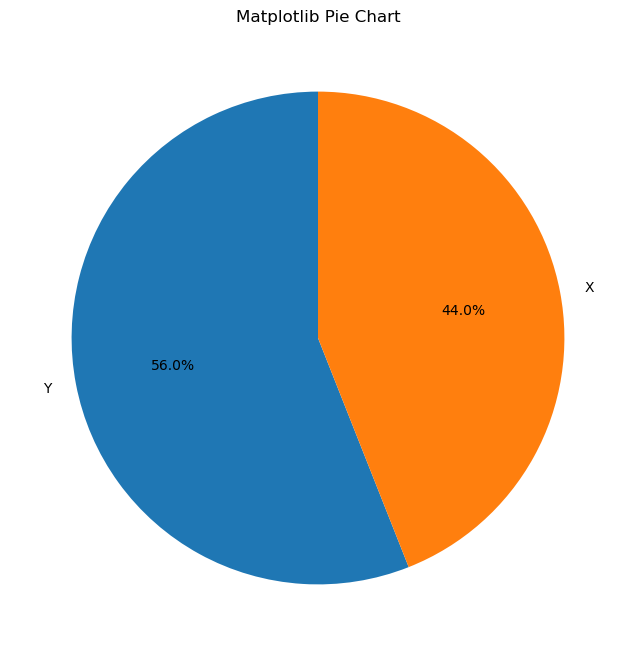

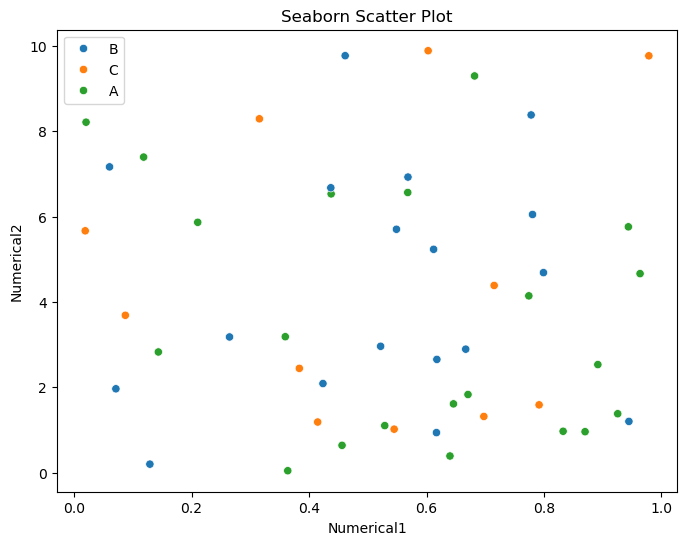

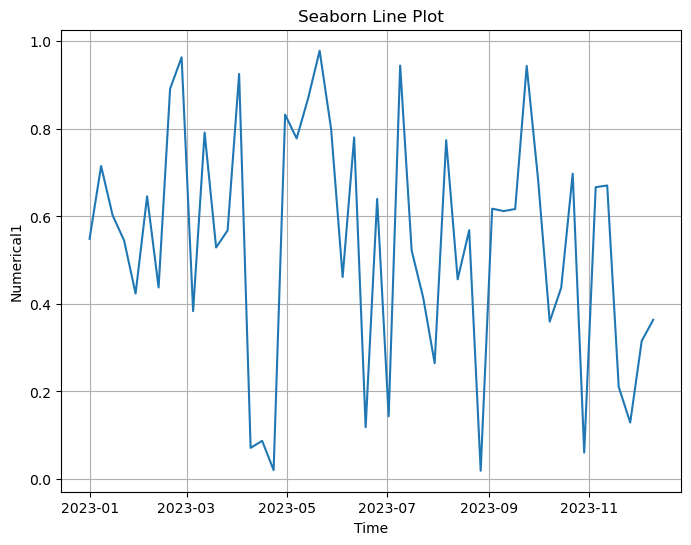

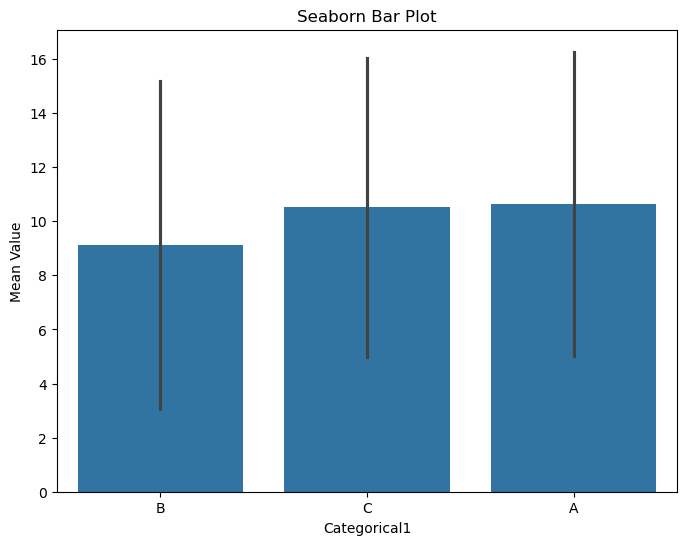

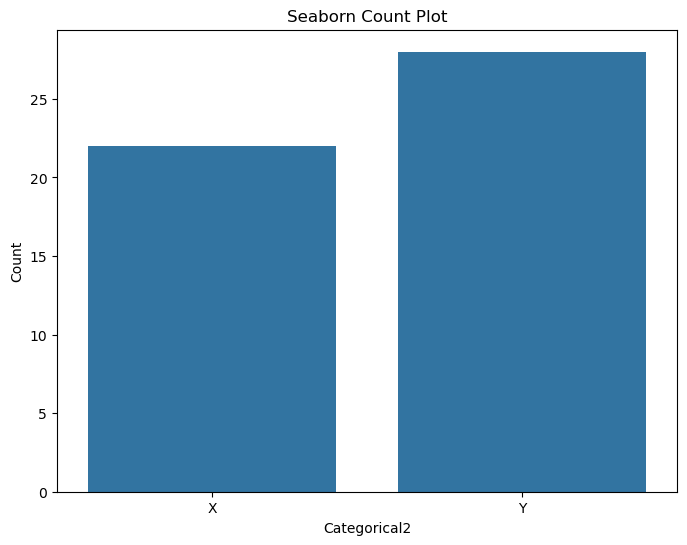

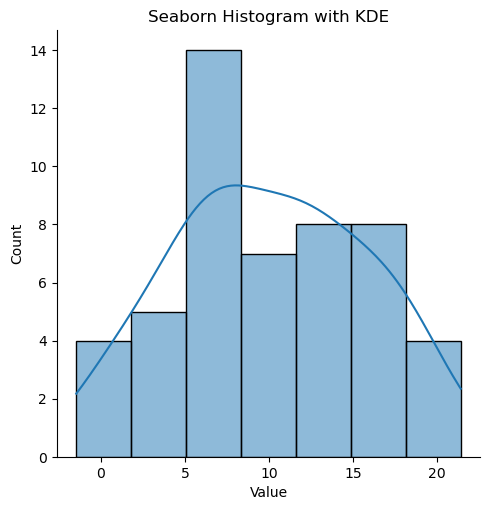

C:\Users\Admin\AppData\Local\Temp\ipykernel_1476\295674949.py:109: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



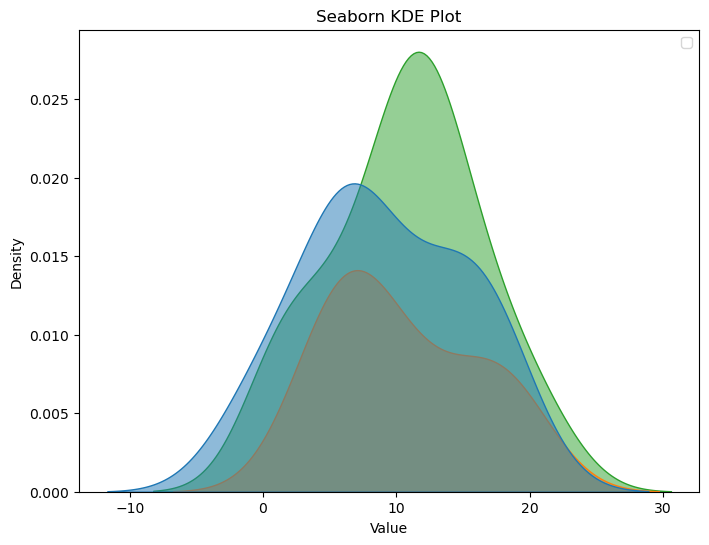

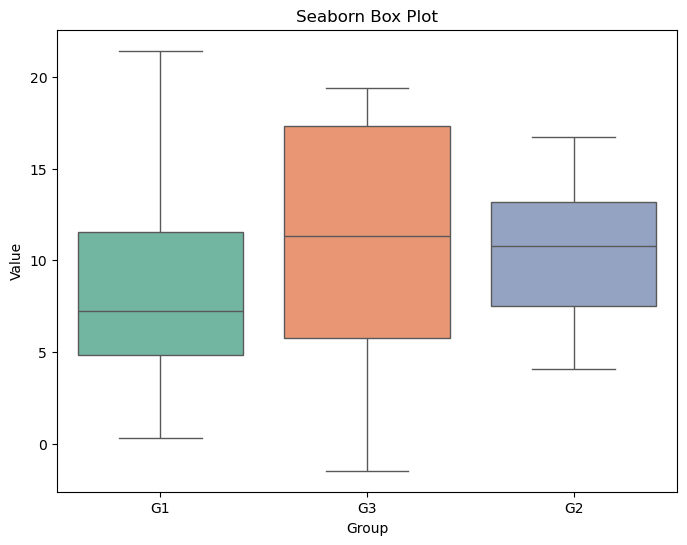

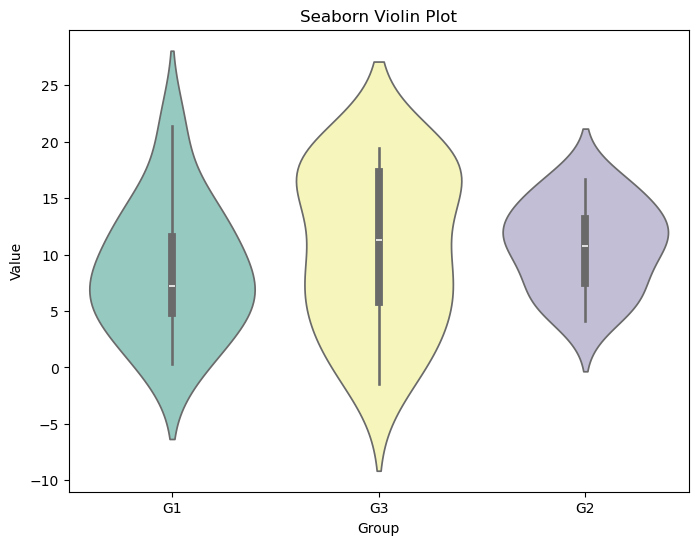

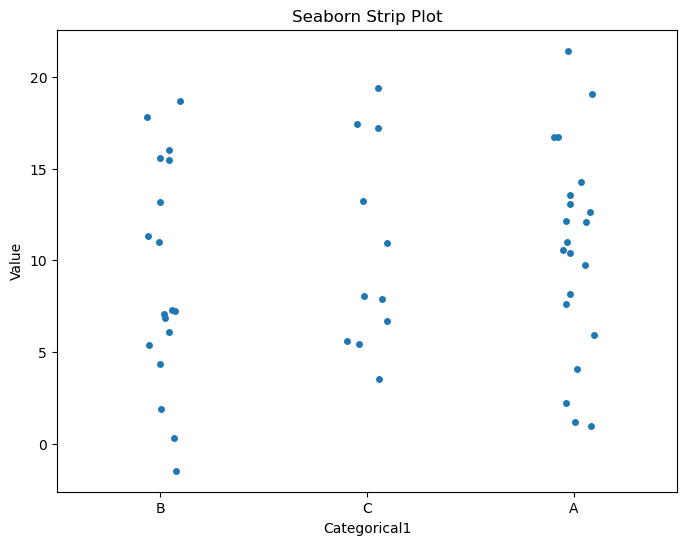

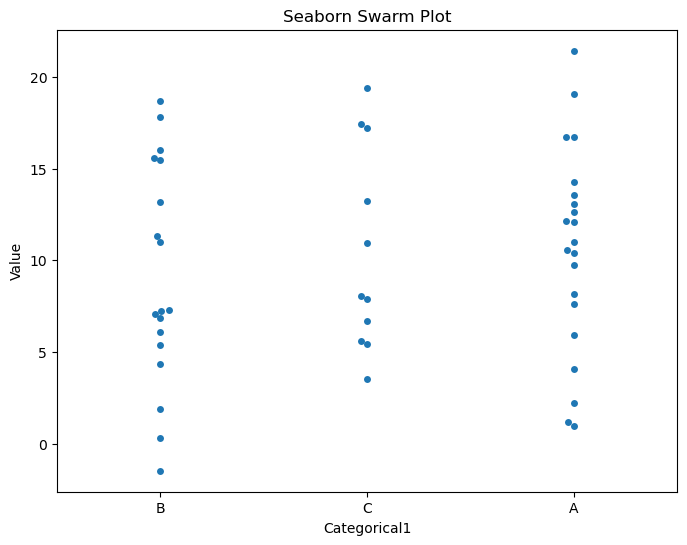

...

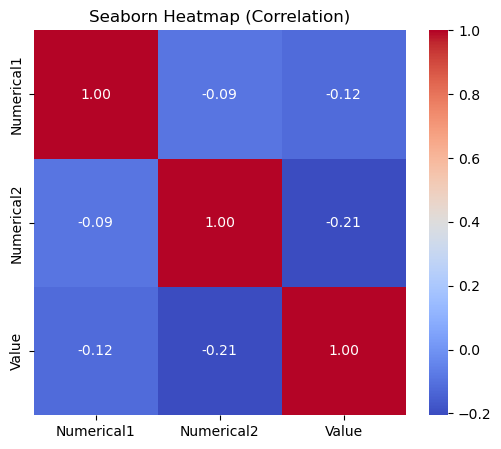

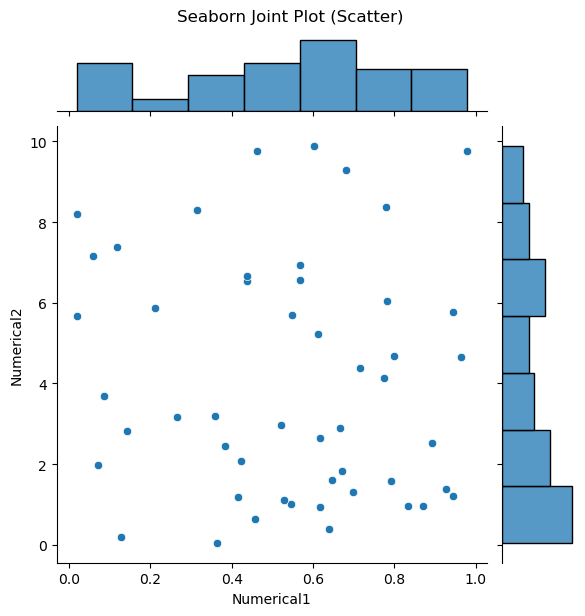

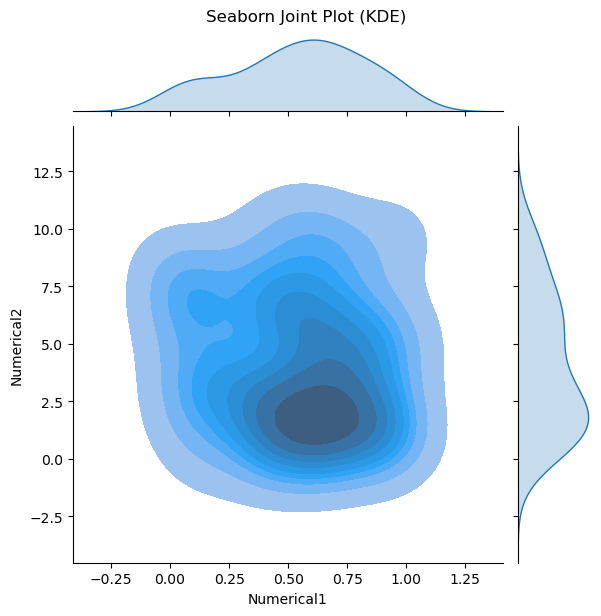

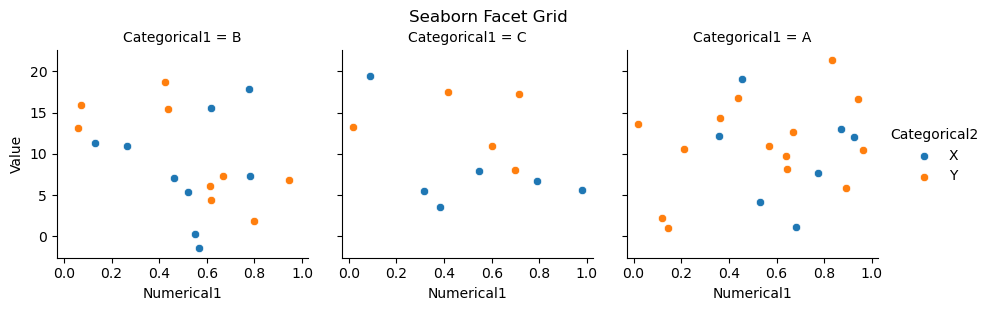

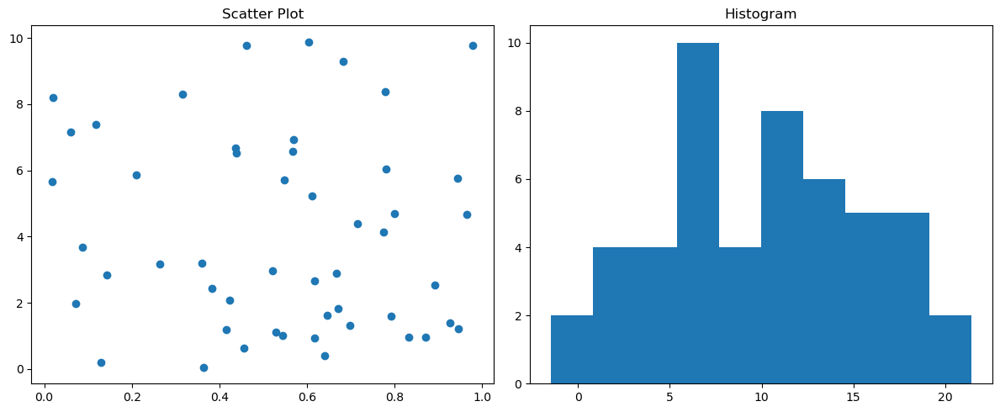

In [120]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Sample Data (replace with your actual data)
np.random.seed(0)
data = pd.DataFrame({
    'Numerical1': np.random.rand(50),
    'Numerical2': np.random.rand(50) * 10,
    'Categorical1': np.random.choice(['A', 'B', 'C'], size=50),
    'Categorical2': np.random.choice(['X', 'Y'], size=50),
    'Value': np.random.randn(50) * 5 + 10,
    'Group': np.random.choice(['G1', 'G2', 'G3'], size=50),
    'Time': pd.date_range('2023-01-01', periods=50, freq='W')
})

# --- Basic Matplotlib Plots ---

# 1. Line Plot
plt.figure(figsize=(8, 6))
plt.plot(data['Time'], data['Numerical1'])
plt.xlabel('Time')
plt.ylabel('Numerical1')
plt.title('Matplotlib Line Plot')
plt.grid(True)
plt.show()

# 2. Scatter Plot
plt.figure(figsize=(8, 6))
plt.scatter(data['Numerical1'], data['Numerical2'])
plt.xlabel('Numerical1')
plt.ylabel('Numerical2')
plt.title('Matplotlib Scatter Plot')
plt.grid(True)
plt.show()

# 3. Bar Plot
category_counts = data['Categorical1'].value_counts()
plt.figure(figsize=(8, 6))
plt.bar(category_counts.index, category_counts.values)
plt.xlabel('Categorical1')
plt.ylabel('Count')
plt.title('Matplotlib Bar Plot')
plt.show()

# 4. Histogram
plt.figure(figsize=(8, 6))
plt.hist(data['Value'], bins=10, edgecolor='black')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Matplotlib Histogram')
plt.show()

# 5. Pie Chart
category_proportions = data['Categorical2'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(category_proportions, labels=category_proportions.index, autopct='%1.1f%%', startangle=90)
plt.title('Matplotlib Pie Chart')
plt.show()

# --- Seaborn Plots ---

# 6. Seaborn Scatter Plot
plt.figure(figsize=(8, 6))
sns.scatterplot(data=data, x='Numerical1', y='Numerical2', hue='Categorical1')
plt.xlabel('Numerical1')
plt.ylabel('Numerical2')
plt.title('Seaborn Scatter Plot')
plt.legend()
plt.show()

# 7. Seaborn Line Plot
plt.figure(figsize=(8, 6))
sns.lineplot(data=data, x='Time', y='Numerical1')
plt.xlabel('Time')
plt.ylabel('Numerical1')
plt.title('Seaborn Line Plot')
plt.grid(True)
plt.show()

# 8. Seaborn Bar Plot
plt.figure(figsize=(8, 6))
sns.barplot(data=data, x='Categorical1', y='Value', errorbar='sd')
plt.xlabel('Categorical1')
plt.ylabel('Mean Value')
plt.title('Seaborn Bar Plot')
plt.show()

# 9. Seaborn Count Plot
plt.figure(figsize=(8, 6))
sns.countplot(data=data, x='Categorical2')
plt.xlabel('Categorical2')
plt.ylabel('Count')
plt.title('Seaborn Count Plot')
plt.show()

# 10. Seaborn Histogram (using displot)
sns.displot(data=data, x='Value', kde=True)
plt.title('Seaborn Histogram with KDE')
plt.show()

# 11. Seaborn KDE Plot
plt.figure(figsize=(8, 6))
sns.kdeplot(data=data, x='Value', hue='Categorical1', fill=True, alpha=0.5)
plt.xlabel('Value')
plt.ylabel('Density')
plt.title('Seaborn KDE Plot')
plt.legend()
plt.show()

# 12. Seaborn Box Plot (as requested before - corrected for FutureWarning)
plt.figure(figsize=(8, 6))
sns.boxplot(data=data, x='Group', y='Value', hue='Group', palette='Set2', legend=False)
plt.xlabel('Group')
plt.ylabel('Value')
plt.title('Seaborn Box Plot')
plt.show()

# 13. Seaborn Violin Plot (as requested before - corrected for FutureWarning)
plt.figure(figsize=(8, 6))
sns.violinplot(data=data, x='Group', y='Value', hue='Group', palette='Set3', legend=False)
plt.xlabel('Group')
plt.ylabel('Value')
plt.title('Seaborn Violin Plot')
plt.show()

# 14. Seaborn Strip Plot
plt.figure(figsize=(8, 6))
sns.stripplot(data=data, x='Categorical1', y='Value', jitter=True)
plt.xlabel('Categorical1')
plt.ylabel('Value')
plt.title('Seaborn Strip Plot')
plt.show()

# 15. Seaborn Swarm Plot
plt.figure(figsize=(8, 6))
sns.swarmplot(data=data, x='Categorical1', y='Value')
plt.xlabel('Categorical1')
plt.ylabel('Value')
plt.title('Seaborn Swarm Plot')
plt.show()

# 16. Seaborn Pair Plot
sns.pairplot(data, hue='Categorical1')
plt.suptitle('Seaborn Pair Plot', y=1.02)
plt.show()

# 17. Seaborn Heatmap (Correlation Matrix)
correlation_matrix = data[['Numerical1', 'Numerical2', 'Value']].corr()
plt.figure(figsize=(6, 5))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Seaborn Heatmap (Correlation)')
plt.show()

# 18. Seaborn Joint Plot (Scatter and Histograms)
sns.jointplot(data=data, x='Numerical1', y='Numerical2', kind='scatter')
plt.suptitle('Seaborn Joint Plot (Scatter)', y=1.02)
plt.show()

# 19. Seaborn Joint Plot (KDE)
sns.jointplot(data=data, x='Numerical1', y='Numerical2', kind='kde', fill=True)
plt.suptitle('Seaborn Joint Plot (KDE)', y=1.02)
plt.show()

# 20. Seaborn Facet Grid (for plotting subsets of data)
g = sns.FacetGrid(data, col='Categorical1', hue='Categorical2')
g.map(sns.scatterplot, 'Numerical1', 'Value')
g.add_legend()
g.fig.suptitle('Seaborn Facet Grid', y=1.02)
plt.show()

# 21. Matplotlib Subplots (combining multiple plots)
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.scatter(data['Numerical1'], data['Numerical2'])
plt.title('Scatter Plot')

plt.subplot(1, 2, 2)
plt.hist(data['Value'], bins=10)
plt.title('Histogram')

plt.tight_layout()
plt.show()

